# Cluster Analysis Tutorial

This notebook is a continuation of the Preprocess tutorial, and assumes you are working with an adata object that has been pre-processed (i.e. quality controlled to filter cells, normalized, highly variable genes selected, visualization coordinates calculated). In this tutorial, we will cluster our dataset, identify marker genes and annotate our clusters, and look at the expression of individual genes.

This notebook is largely adapted from an [ipython notebook](https://github.com/theislab/single-cell-tutorial) provided by the Theis Lab as part of their Molecular Systems Biology submission "Current best practices in single‐cell RNA‐seq analysis: a tutorial" ([Luecken and Theis, 2019](https://doi.org/10.15252/msb.20188746)). Both the notebook and paper are worth checking out to get a more in-depth idea of the steps involved with scRNA-seq analysis (and the "best" ways to do them!).

For these tutorials, we will be working with a publicly available scRNA-seq dataset of human cerebral organoids generated using 10x Genomics and preprocessed using Cell Ranger ([Kanton et al., 2019](https://www.nature.com/articles/s41586-019-1654-9#citeas)). This dataset is used in an excellent [scRNA-seq tutorial](https://github.com/quadbiolab/scRNAseq_analysis_vignette/blob/master/Tutorial.md#now-lets-start-part-1) using R and Seurat by Zhisong He and Barbara Treutlein, which we also highly recommend.

# Table of Contents

* [1 Setting Up the Coding Environment](#1-Setting-Up-the-Coding-Environment)
* [2 Reading in the Data](#2-Reading-in-the-Data)
* [3 Clustering](#3-Clustering)
* [4 Marker Genes and Cluster Annotation](#4-Marker-Genes-and-Cluster-Annotation)
    - [Data-Deriven Marker Genes](#Data-Deriven-Marker-Genes)
    - [Known Marker Genes](#Known-Marker-Genes)
    - [Annotation](#Annotation)
* [5 Cluster Manipulation](#5-Cluster-Manipulation)
    - [Removing Clusters](#Removing-Clusters)
    - [Merging Clusters](#Merging-Clusters)
    - [Splitting Clusters](#Splitting-Clusters)
* [6 Summary](#6-Summary)
* [7 Appendix](#7-Appendix)
    - [Subsetting Data](#Subsetting-Data)
    - [Compare Cluster Gene Expression](#Compare-Cluster-Gene-Expression)

# 1 Setting Up the Coding Environment

Just like in our Preprocess tutorial, we need to set up our jupyter notebook and load in all of the python modules, packages, and libraries we need for scRNA-seq analysis. The coding environment for this notebook is very similar to our coding environment for the Preprocess notebook, the biggest difference being the absence of the `rpy2` tool. In the Preprocess notebook we needed to use `rpy2` so that we could move our adata object into R for `scran` normalization. In this notebook we are staying in python the whole time, so there's no need to load in `rpy2` (or, by extension, any R libraries).

In [1]:
# main scRNA-seq analysis toolkit
import scanpy as sc

# data science tools
import numpy as np
import scipy as sp
import pandas as pd

# data visualization
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb

# handles warnings; we are importing this to actually suppress some annoyting warning messages downstream
import warnings

# operating system interface
import os

In [2]:
plt.rcParams['figure.figsize']=(2,2) # rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(dpi=200, dpi_save=300, format='ps') # scanpy figure parameters
#sc.logging.print_versions() # prints out version info for modules/packages/libraries used in the notebook. Important for reproducibility! 

In [3]:
# Files and Directories
sc.settings.figdir = './figures/'
results = './results/scanpy_tutorial.h5ad'

For this notebook, we are also going to define some color maps to look at gene expression in our UMAP plots. Here we define a *purple_colormap* and a *green_colormap*. You can easily change the colors to your own personal preference. Scanpy's plots are built on `matplotlib`, a python library used for data visualization. You can see all of the available colormaps in `matplotlib` [here](https://matplotlib.org/stable/tutorials/colors/colormaps.html). The colors you pick for your plots really matter in data science and bioinformatics, as different color schemes can be used to convey different information. *Sequential* colormaps are used for representing information that has ordering (think of the expression of a gene in a cell; it can highly expressed, weakly expressed, or not expressed at all). *Diverging* colormaps are used for when the information being plotted has a critical middle value (for instance, you have a base gene expression and want to know if that gene is upregulated or downregulated in the cells in your dataset). *Qualitative* colormaps are often miscellaneous colors and should be used to represent information which does not have ordering or relationships (most UMAP/tSNE plots use qualitative colormaps to color the clusters).

In [4]:
# Define a color map for combined marker expression
colors2p = plt.cm.Purples(np.linspace(0, 1, 128))
colors3p = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsCombp = np.vstack([colors3p, colors2p])
mymap_purple = colors.LinearSegmentedColormap.from_list('purple_colormap', colorsCombp)

# Define a color map for individual gene expression
colors2r = plt.cm.Greens(np.linspace(0, 1, 128))
colors3r = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsCombr = np.vstack([colors3r, colors2r])
mymap_green = colors.LinearSegmentedColormap.from_list('green_colormap', colorsCombr)

# 2 Reading in the Data

In our Preprocess tutorial we read in the data files generated by Cell Ranger. Here, we are going to read in our preprocessed adata object from the Preprocess tutorial (remember, we saved this as an .h5ad file at the end of the notebook). Reading in .h5ad objects is super simple in scanpy.

In [5]:
# load in saved adata object
adata = sc.read(results)

In [6]:
# If we look at our adata object, we should see all of our additions from the preprocessing steps
adata

AnnData object with n_obs × n_vars = 4259 × 22129
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'diffmap_evals', 'hvg', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_diffmap', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

# 3 Clustering

Clustering is a central component of any scRNA-seq analysis pipeline (and is the most recognizable! Everyone can clock a tSNE or UMAP plot). In order to more comprehensively understand the underlying heterogeneity in our dataset, we need to identify cell groups in an unbiased way, which is what clustering does. When we cluster our data, we are embedding our cells in a graph structure (typically using a K-nearest neighbor, or KNN, graph), with edges drawn between cells that share similar gene expression patterns. The graph structure is partitioned into highly interconnected communities, where cells that are most alike to one another are partitioned into the same community.

We do have some input over what the clusters look like. By using the *resolution* parameter in our clustering function (see code block below), we can control whether we get back major, coarse clusters (e.g. major cells types) or smaller, refined clusters (e.g. cell subtypes). The resolution that works best for you depends on your dataset and your specific questions. Note that you can lose meaningful biological information if you under-cluster or over-cluster, and it's best to try out a few different resolution parameters and compare the resulting clusters with gene expression and known biology before settling on a final clustering.

In [7]:
# Perform clustering using highly variable genes and different resolution parameters
# The clusterings found by different resolution parameters are all stored as observations in the adata object
sc.tl.leiden(adata, resolution=1.0, key_added='leiden_r1.0')
sc.tl.leiden(adata, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_r0.5')

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_r1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden_r0.8', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r0.5', the cluster labels (adata.obs, categorical) (0:00:00)


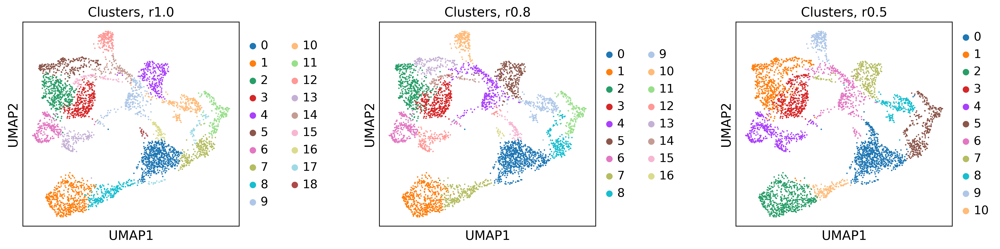

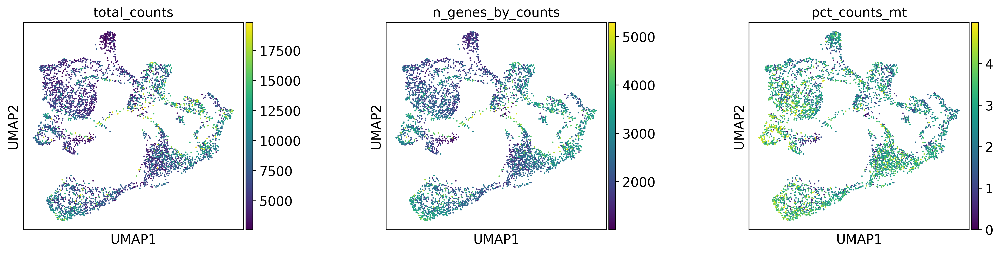

In [8]:
# Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['leiden_r1.0', 'leiden_r0.8', 'leiden_r0.5'], 
                  title=['Clusters, r1.0', 'Clusters, r0.8', 'Clusters, r0.5'],
                  wspace = 0.5, 
                  size = 10)

sc.pl.umap(adata, color=['total_counts', 'n_genes_by_counts', 'pct_counts_mt'],
                  wspace = 0.5, 
                  size = 10)

You can see that setting our *resolution* parameter to "1.0" resulted in the most clusters, while setting our *resolution* parameter to "0.5" resulted in the fewest clusters. For demonstration purposes, we'll work with the middle-ground *resolution* parameter of "0.8". You can also see that we don't really have any one single cluster that is dominated by our QC metrics, which is good. If we did, we would want to revisit our preprocessing steps or potentially remove the entire offending cluster from our dataset at this point. You always want to check and make sure that your clusters appear to be driven by biology and not by technical covariates (this alsos include *batch* if you are working with a combined dataset).

# 4 Marker Genes and Cluster Annotation

## Data-Deriven Marker Genes

To begin annotating our clusters, we first find genes that are up-regulated in each cluster compared to all other clusters. These are our marker genes. All genes are taken into account (i.e., the test is automatically performed on the data stored in *adata.raw*, which is uncorrected and contains all genes), as any gene may be an informative marker. Here we identify and return the top 20 marker genes for each cluster.

In [9]:
# Calculate marker genes
sc.tl.rank_genes_groups(adata, groupby='leiden_r0.8', key_added='rank_genes_all', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_all']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


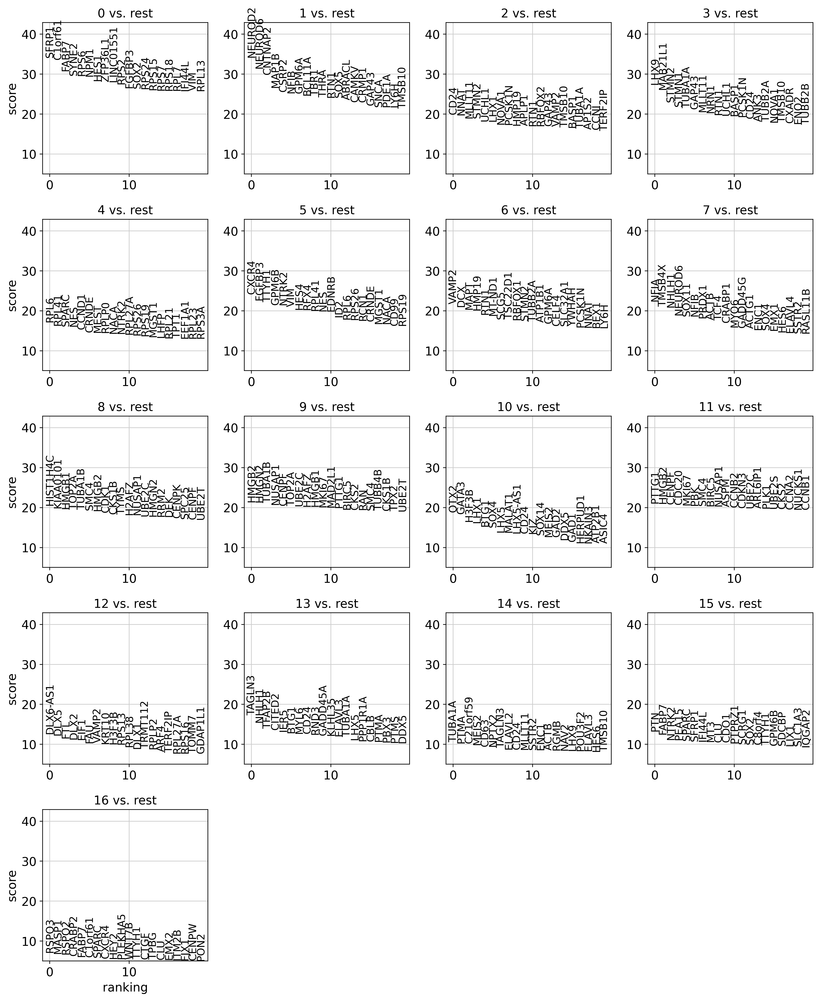

In [10]:
# Plot marker genes
sc.pl.rank_genes_groups(adata, 
                        key = 'rank_genes_all', 
                        groups = ['0', '1', '2', '3', '4', '5', '6', '7', '8',
                                  '9', '10', '11', '12', '13', '14', '15', '16'], 
                        fontsize = 12)

Looking at these plots, we can already start to identify some of clusters. Cluster 12 is characterized by high expression of DLX6-AS1 and DLX5, which are known interneuron markers. Cluster 6 has high expression of DCX, a neuronal marker, and Cluster 15 has high expression of progenitor markers PTN and FABP7. (Note: if you want to get these results as a dataframe, run `sc.get.rank_genes_groups_df(adata, group=None, key='rank_genes_all')`!)

## Known Marker Genes

To further identify the clusters, we can also look at the overlap of data-deriven marker genes with a list of known marker genes in our biological system. In practice, marker gene sets can be obtained from public databases such as Linnarson's mouse brain atlas, various Human Cell Atlas datasets, other published reference atlases, and even data generated in your own lab. (It should be noted that marker genes may not always overlap as expected given that atlases tend to be investigated under wild-type conditions.)

In [11]:
# Known marker genes:
marker_genes = dict()
marker_genes['progenitor']=['NES', 'SOX2', 'VIM', 'PTN', 'FABP7', 'PAX6']
marker_genes['IPC']=['EOMES', 'SEMA3C', 'NEUROD1', 'SSTR2']
marker_genes['neuron']=['DCX', 'NEUROD6', 'FOXG1']
marker_genes['interneuron']=['DLX6-AS1', 'DLX5', 'SST', 'LHX6', 'GAD1', 'GAD2']
marker_genes['dorsal_telencephalon']=['EMX1', 'PAX6', 'GLI3', 'EOMES', 'NEUROD6']
marker_genes['ventral_telencephalon']=['DLX2', 'DLX5', 'ISL1', 'SIX3', 'NKX2.1', 'SOX6', 'NR2F2']
marker_genes['diencephalon']=['RSPO3', 'TCF7L2', 'LHX9']

We can calculate an overlap score between data-deriven marker genes (stored in `rank_genes_all`) and provided markers (in this case, `marker_genes`, the dictionary we constructed in the preceeding code chunk). The output is a pandas dataframe which we can use to annotate clusters based on marker gene overlaps.

In [12]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_all')
cell_annotation

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
progenitor,5.0,0.0,0.0,0.0,3.0,3.0,0.0,0.0,3.0,1.0,0.0,3.0,0.0,0.0,0.0,5.0,3.0
IPC,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
neuron,0.0,3.0,1.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
interneuron,0.0,0.0,1.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,2.0,0.0,4.0,0.0,0.0,0.0,0.0
oligodendrocyte,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
astrocyte,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
CR,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0
dorsal_telencephalon,1.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
ventral_telencephalon,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0
diencephalon,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In this next code chunk, we are creating expression marker profiles for our dataset based on our known marker genes. First we check if our marker genes are present in our dataset. We can take an array of marker genes for a specified cell type, i.e *progenitor*, and check that array against all the genes present in our adata object. This returns an array of booleans (for each gene in our adata object, if it matches one of our marker genes we assign the value *True*, and if no match is found we assign the value *False*). Next, we calculate the mean expression of all marker genes found in our dataset per cell and store these values in our adata object as observations (obs). This lets us plot marker expression profiles for specific cell types based on known marker genes, which is another way that we can start annotating clusters.

In [13]:
# Check expression of markers
ids_progenitor = np.in1d(adata.var_names, marker_genes['progenitor'])
ids_IPC = np.in1d(adata.var_names, marker_genes['IPC'])
ids_neuron = np.in1d(adata.var_names, marker_genes['neuron'])
ids_interneuron = np.in1d(adata.var_names, marker_genes['interneuron'])
ids_dorsal_telencephalon = np.in1d(adata.var_names, marker_genes['dorsal_telencephalon'])
ids_ventral_telencephalon = np.in1d(adata.var_names, marker_genes['ventral_telencephalon'])
ids_diencephalon = np.in1d(adata.var_names, marker_genes['diencephalon'])

# Calculate the mean expression of markers
adata.obs['progenitor_marker_expr'] = np.ravel(adata.X[:,ids_progenitor].mean(1))
adata.obs['IPC_marker_expr'] = np.ravel(adata.X[:,ids_IPC].mean(1))
adata.obs['neuron_marker_expr'] = np.ravel(adata.X[:,ids_neuron].mean(1))
adata.obs['interneuron_marker_expr'] = np.ravel(adata.X[:,ids_interneuron].mean(1))
adata.obs['dorsal_telencephalon_marker_expr'] = np.ravel(adata.X[:,ids_dorsal_telencephalon].mean(1))
adata.obs['ventral_telencephalon_marker_expr'] = np.ravel(adata.X[:,ids_ventral_telencephalon].mean(1))
adata.obs['diencephalon_marker_expr'] = np.ravel(adata.X[:,ids_diencephalon].mean(1))

In [14]:
# If you check our adata object, you'll see these marker expression profiles stored as observations (obs)
adata

AnnData object with n_obs × n_vars = 4259 × 22129
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'leiden_r1.0', 'leiden_r0.8', 'leiden_r0.5', 'progenitor_marker_expr', 'IPC_marker_expr', 'neuron_marker_expr', 'interneuron_marker_expr', 'oligodendrocyte_marker_expr', 'astrocyte_marker_expr', 'CR_marker_expr', 'dorsal_telencephalon_marker_expr', 'ventral_telencephalon_marker_expr', 'diencephalon_marker_expr'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'diffmap_evals', 'hvg', 'neighbors', 'pca', 'tsne', 'umap', 'leiden', 'leiden_r1.0_colors', 'leiden_r0.8_colors', 'leiden_r0.5_colors', 'rank_genes_all'
    obsm: 'X_diffmap', 'X_pca', 'X_tsne', '

Now we can plot the combined marker expression we established above to help us with cluster annotation.

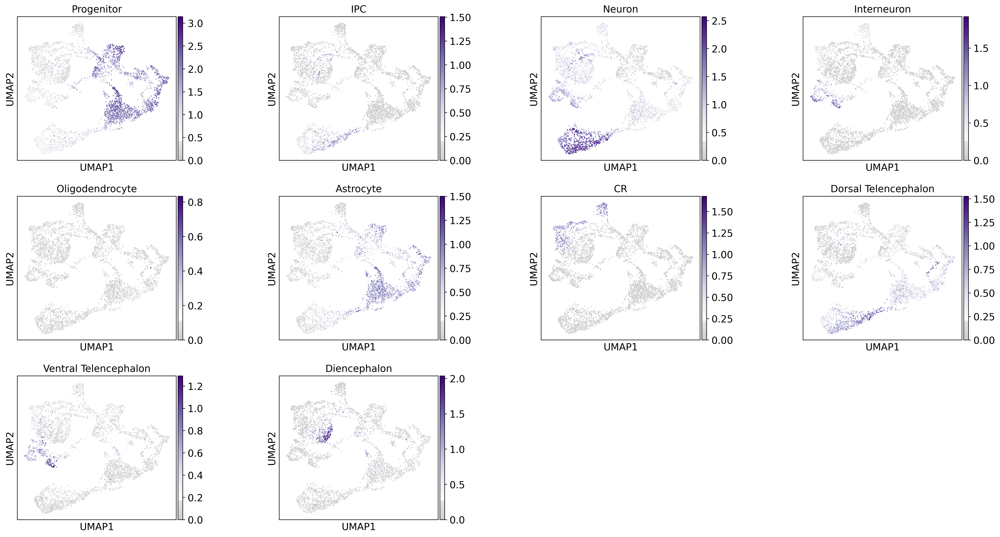

In [17]:
sc.pl.umap(adata, color=['progenitor_marker_expr', 'IPC_marker_expr', 'neuron_marker_expr', 'interneuron_marker_expr',
                         'dorsal_telencephalon_marker_expr', 'ventral_telencephalon_marker_expr',
                         'diencephalon_marker_expr'],
                  title=['Progenitor', 'IPC', 'Neuron', 'Interneuron', 'Dorsal Telencephalon', 
                         'Ventral Telencephalon', 'Diencephalon'],
                  color_map=mymap_purple,
                  wspace=0.5,
                  size=10)

Using these marker expression profiles, we can see some trends in our data. More progenitor-like cells are clustered on the righthand side of the UMAP, while more differentiated cells are clustered on the lefthand side of the UMAP. We can also see that cells with a dorsal telencephalon identity are clustered at the bottom-left of the UMAP, while cells with a ventral telencephalon identity are clustered in the middle-left of the UMAP.

We can also look at the expression of individual genes of interest to help us annotate our clusters.

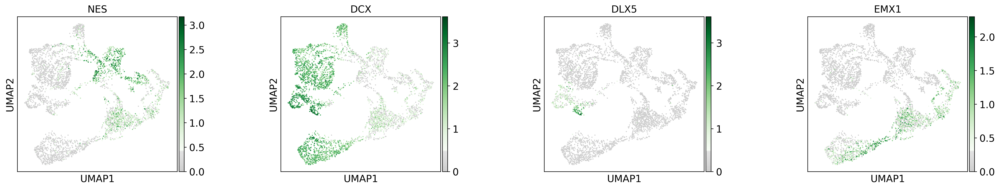

In [21]:
sc.pl.umap(adata, color=['NES', 'DCX', 'DLX5', 'EMX1'],
                  color_map=mymap_green,
                  wspace=0.5,
                  size=10)

Looking at these individual markers confirms what we noted above with our expression marker profiles, with clear distinctions between progenitors (NES+) and neurons (DCX+), and ventral cells (DLX5+) and dorsal cells (EMX1+).

## Annotation

Taken together, we can use our data-deriven marker genes, known marker genes, marker gene expression profiles, and expression of individual genes to annotate our clusters. This process can take some time depending on your dataset and prior knowledge of what cell types you expect to be present. This is how cell cluster annotation is usually done, though if you feel it is too subjective or relies too much on personal judgement there are several more objective and unbiased ways to do automated or semi-automated annotation. Check out this paper [here](https://doi.org/10.1016/j.csbj.2021.01.015) to get an idea of what tools are out there, and what general methods they use to annotate clusters. Check out [this](https://docs.scvi-tools.org/en/stable/user_guide/notebooks/cellassign_tutorial.html) tutorial to see how to use scvi-tools CellAssign, which integrates nicely with the scanpy ecosystem.

In [25]:
# Let's look at our categories to rename (i.e., the cluster labels)
adata.obs['leiden_r0.8'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16'],
      dtype='object')

In [50]:
# And now let's rename them! 
# Note that these names are not 100% accurate, but for tutorial purposes they're fine.
adata.obs['leiden_r0.8'] = adata.obs['leiden_r0.8'].cat.rename_categories(['Dorsal telen. NPC2', 
                                                                          'Dorsal telen. neuron', 
                                                                          'Midbrain-hindbrain neuron',
                                                                          'Dien. excitatory neuron', 
                                                                          'Dien. and midbrain NPC2', 
                                                                          'Dien. and midbrain NPC1',
                                                                          'Ventral telen. neuron', 
                                                                          'Dorsal telen. IPC', 
                                                                          'Dorsal telen. NPC1',
                                                                          'G2M dien. and midbrain NPC', 
                                                                          'Midbrain inhibitory neuron', 
                                                                          'G2M dorsal telen. NPC', 
                                                                          'MGE inhibitory neuron', 
                                                                          'Dien. and midbrain IPC and early inhibitory neuron 1',
                                                                          'Dien. and midbrain IPC and early inhibitory neuron 2', 
                                                                          'Unknown NPC1',
                                                                          'Unknown NPC2'])

In [51]:
# Quick check to see how many cells of each type we have
adata.obs['leiden_r0.8'].value_counts()

Dorsal telen. NPC2                                      714
Dorsal telen. neuron                                    484
Midbrain-hindbrain neuron                               441
Dien. excitatory neuron                                 387
Dien. and midbrain NPC2                                 289
Dien. and midbrain NPC1                                 264
Ventral telen. neuron                                   251
Dorsal telen. IPC                                       238
Dorsal telen. NPC1                                      188
G2M dien. and midbrain NPC                              187
Midbrain inhibitory neuron                              176
G2M dorsal telen. NPC                                   165
MGE inhibitory neuron                                   163
Dien. and midbrain IPC and early inhibitory neuron 1    144
Dien. and midbrain IPC and early inhibitory neuron 2     79
Unknown NPC1                                             72
Unknown NPC2                            

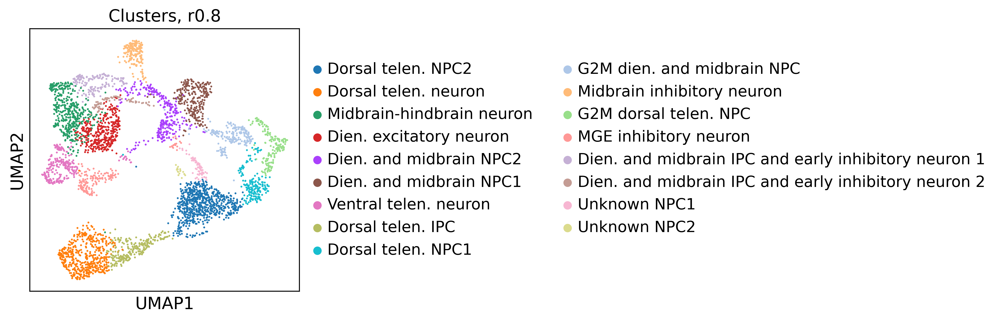

In [53]:
# Plot our UMAP with the new cluster labels
sc.pl.umap(adata, color=['leiden_r0.8'],
                  title=['Clusters, r0.8'],
                  wspace = 0.5, 
                  size = 10)

# 5 Cluster Manipulation

Sometimes it might be justified to manipulate your clusters. This could entail removing clusters from your dataset (they look stressed/dying, they are small and confounding, they are not important for your individual analysis, etc.), merging similar clusters, and splitting individual clusters to tease apart cell subtypes that might have initially been clustered together. Let's go through some examples with our dataset.

## Removing Clusters

For the sake of practice, let's filter out our two unknown NPC clusters.

In [54]:
# The ~ in the command below inverts the boolean mask, so you can get all cells that aren't in our unknown NPC clusters.
# If we wanted to subset our data to just a few clusters, we would use this same .isin() function!
adata = adata[~adata.obs['leiden_r0.8'].isin(['Unknown NPC1', 'Unknown NPC2']),:].copy()

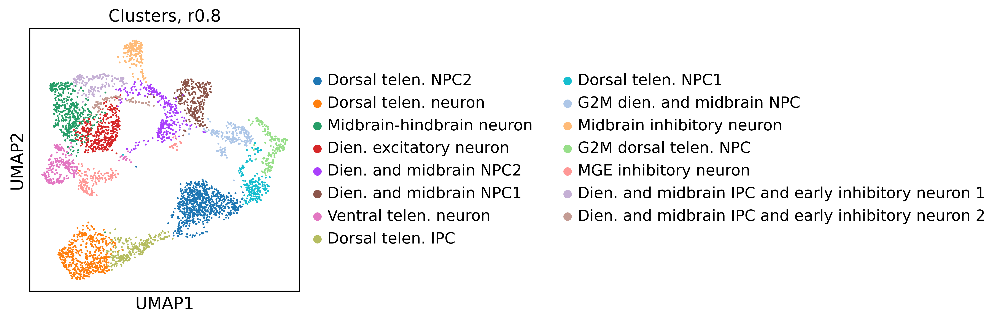

In [55]:
# Plot our UMAP, now without Unknown NPC1 and Unknown NPC2
sc.pl.umap(adata, color=['leiden_r0.8'],
                  title=['Clusters, r0.8'],
                  wspace = 0.5, 
                  size = 10)

## Merging Clusters

For the sake of practice, let's merge clusters Dien. and midbrain IPC and early inhibitory neuron 1 and 2.

In [56]:
# To merge clusters, we just name them the same thing
adata.obs['leiden_r0.8'] = (adata.obs["leiden_r0.8"]
                            .map(lambda x: {"Dien. and midbrain IPC and early inhibitory neuron 1": 
                                            "Dien. and midbrain IPC and early inhibitory neuron",
                                            "Dien. and midbrain IPC and early inhibitory neuron 2":
                                            "Dien. and midbrain IPC and early inhibitory neuron"}.get(x, x))
                            .astype("category"))

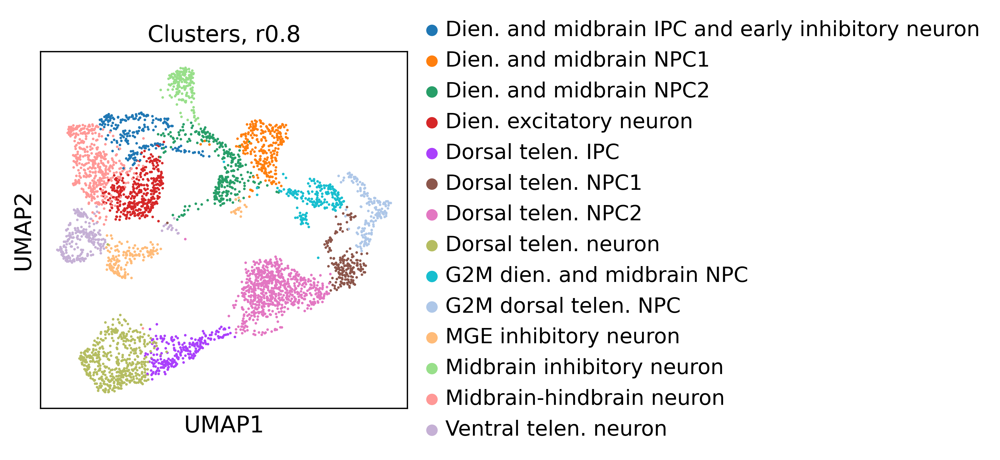

In [57]:
# Plot our UMAP, now with one Dien. and midbrain IPC and early inhibitory neuron cluster
sc.pl.umap(adata, color=['leiden_r0.8'],
                  title=['Clusters, r0.8'],
                  wspace = 0.5, 
                  size = 10)

## Splitting Clusters

For the sake of practice, let's split cluster Dorsal telen. NPC1. This is a little more complicated, and involves re-clustering just the cluster of interest, getting new marker genes, and annotating the new subclusters.

In [62]:
sc.tl.leiden(adata, restrict_to=('leiden_r0.8', ['Dorsal telen. NPC1']), resolution=0.3, key_added='leiden_r0.8_split')

running Leiden clustering
    finished: found 15 clusters and added
    'leiden_r0.8_split', the cluster labels (adata.obs, categorical) (0:00:00)


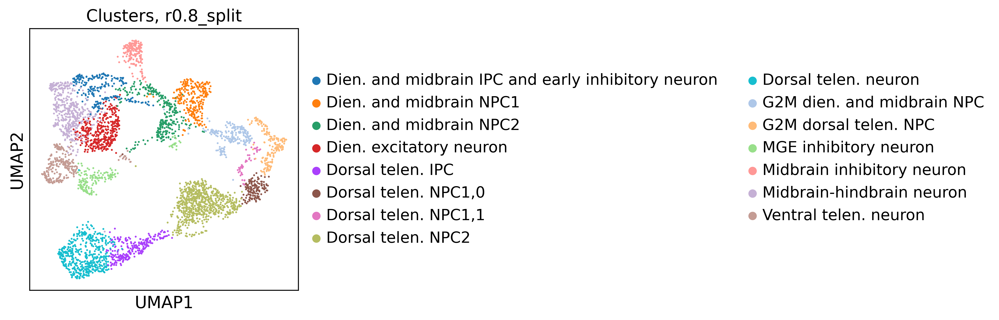

In [63]:
# Plot the new clustering
sc.pl.umap(adata, color=['leiden_r0.8_split'],
                  title=['Clusters, r0.8_split'],
                  wspace = 0.5, 
                  size = 10)

In [64]:
# Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='leiden_r0.8_split', key_added='rank_genes_dorsal_telen', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_dorsal_telen']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


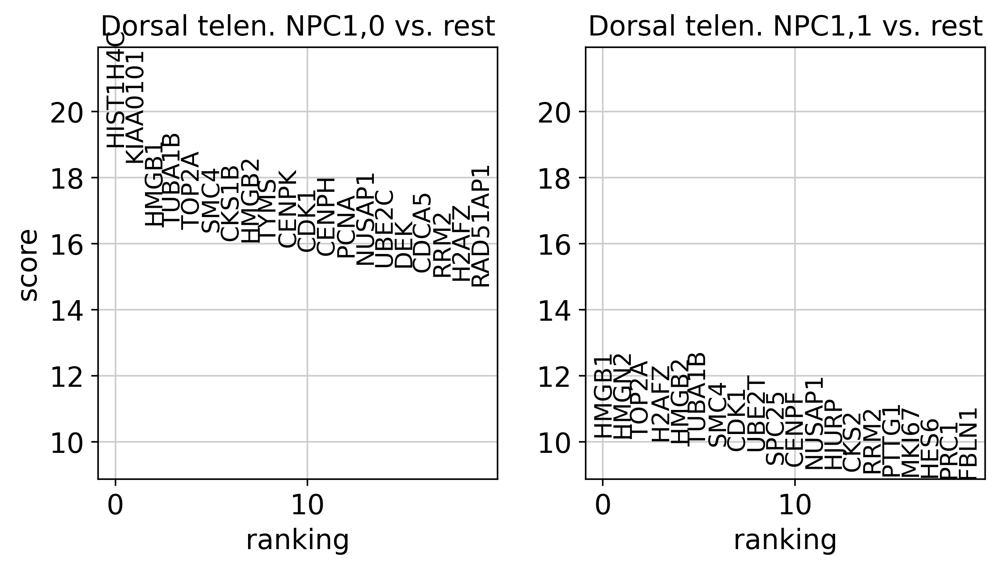

In [65]:
# Plot the new marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_dorsal_telen', 
                               groups=['Dorsal telen. NPC1,0','Dorsal telen. NPC1,1'], 
                               fontsize=12)

In [66]:
# Now we'll rename our Dorsal telen. NPC clusters
adata.obs['leiden_r0.8_split'] = (adata.obs["leiden_r0.8_split"]
                                  .map(lambda x: {"Dorsal telen. NPC1,0": 
                                                  "Dorsal telen. NPC1",
                                                  "Dorsal telen. NPC1,1":
                                                  "Dorsal telen. NPC2",
                                                  "Dorsal telen. NPC2":
                                                  "Dorsal telen. NPC3"}.get(x, x))
                                  .astype("category"))

In [67]:
# And let's make a new adata obs saving this final clustering as 'clusters'
adata.obs['clusters'] = adata.obs['leiden_r0.8_split']

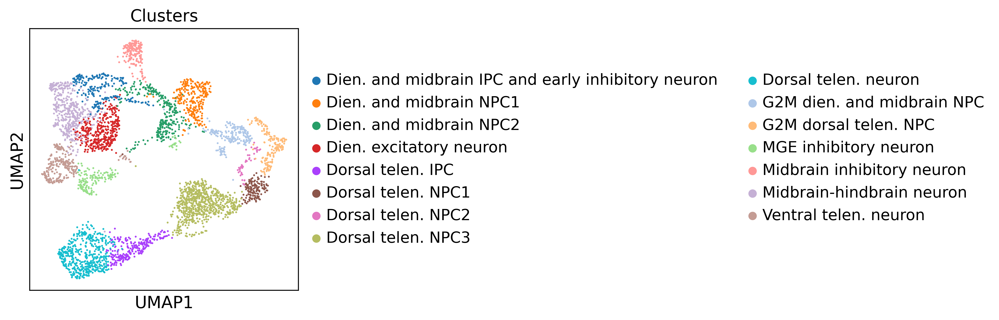

In [68]:
# Plot our final clustering
sc.pl.umap(adata, color=['clusters'],
                  title=['Clusters'],
                  wspace = 0.5, 
                  size = 10)

In [69]:
# Finally, let's save our adata object. It took a lot of work to annotate the clusters!
adata.write(results)

# 6 Summary

Congrats! Another tutorial down! You're well on your way to being a bioinformatics pro! In summary, this tutorial introduced you to all things clusters - how to generate clusters, how to annotate clusters based on data-deriven and known marker genes, and how to manipulate your clusters based on your experiment and specific questions (don't abuse that power! The more hands-off you can be with a dataset and the more unbiased it is the better!). Check out the Appendix for a few more things you can do with your clusters. And as always, (sorry this has been repeated so many times but...) there is no "one size fits all" approach to scRNA-seq analysis. You need to do what's best for your specific dataset and for your specific biological questions.

Next up, pseudotime analysis (our last tutorial for this workshop)!

# Appendix

## Subsetting Data

If we are only interested in a subset of our data, we can easily subset our adata object to just those clusters of interest. For example, let's subset just the dorsal lineage in our sample data.

In [73]:
clusters_to_include = [g for g in adata.obs['clusters'].cat.categories if (g.startswith('G2M dorsal telen. NPC') 
                                                                        or g.startswith('Dorsal'))]

adata_dorsal = adata[np.isin(adata.obs['clusters'], clusters_to_include),:].copy()

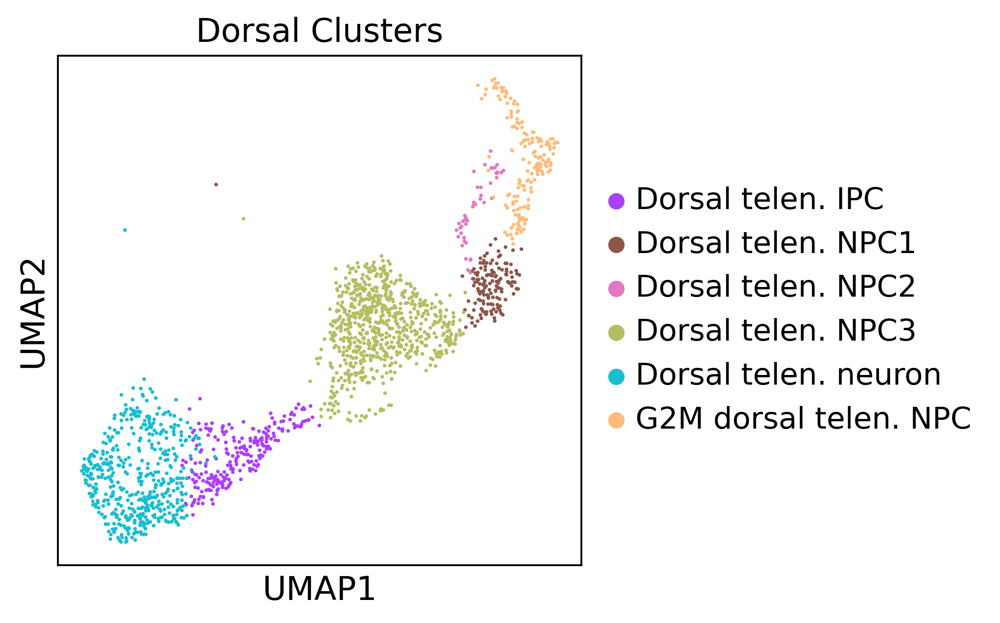

In [75]:
sc.pl.umap(adata_dorsal, color=['clusters'],
                         title=['Dorsal Clusters'],
                         wspace = 0.5, 
                         size = 10)

We can also take our subsetted data and re-cluster it into its own UMAP space, which might provide some additional insight into cell subtypes. To do this, we would find the highly variable genes for our subsetted data and compute new PCA, neighbors, and UMAP coordinates, and do a new cluster analysis.

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r1.0_dorsal', the cluster labels (adata.obs, categorical) (0:00:00)


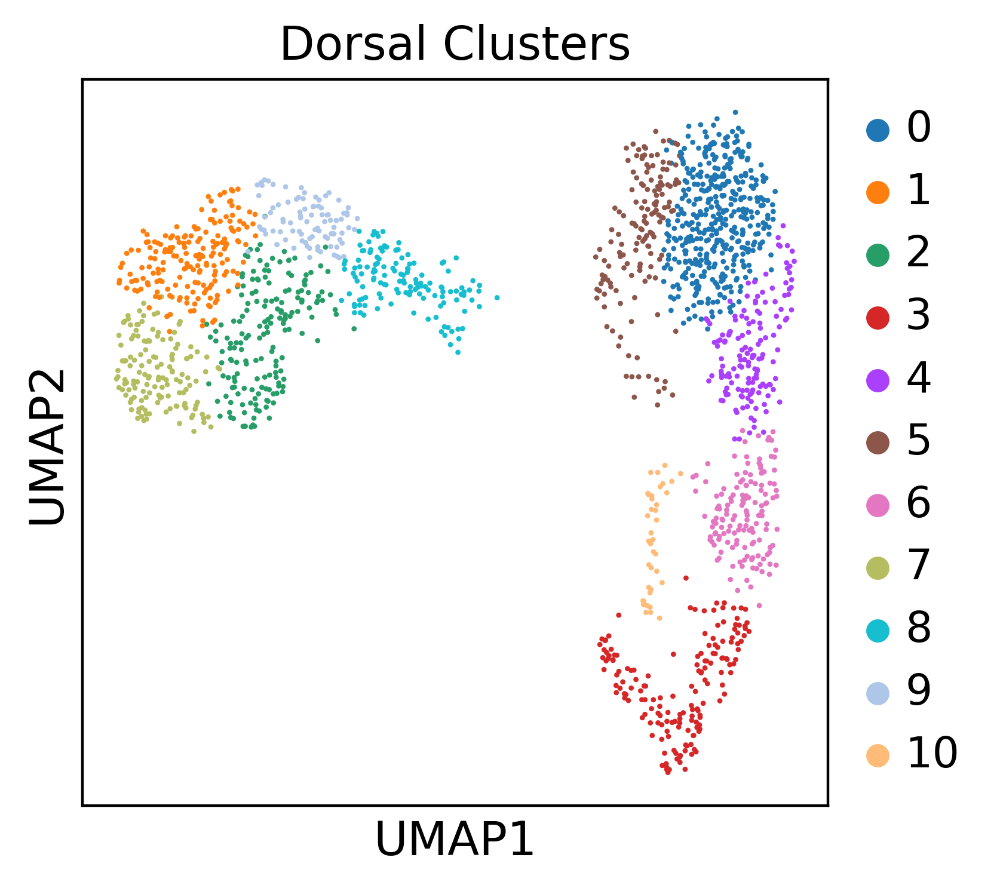

In [76]:
sc.pp.highly_variable_genes(adata_dorsal, flavor='cell_ranger', n_top_genes=4000, subset=True)
sc.pp.pca(adata_dorsal, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_dorsal)
sc.tl.umap(adata_dorsal)
sc.tl.leiden(adata_dorsal, resolution=1.0, key_added='leiden_r1.0_dorsal')

sc.pl.umap(adata_dorsal, color=['leiden_r1.0_dorsal'],
                         title=['Dorsal Clusters'],
                         wspace = 0.5, 
                         size = 10)

## Compare Cluster Gene Expression

When we find our data-deriven marker genes, we are getting the top *n* number of differentially expressed genes per cluster as compared to all the other clusters. But what if we only want to compare one cluster to a single other cluster? Here's how!

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


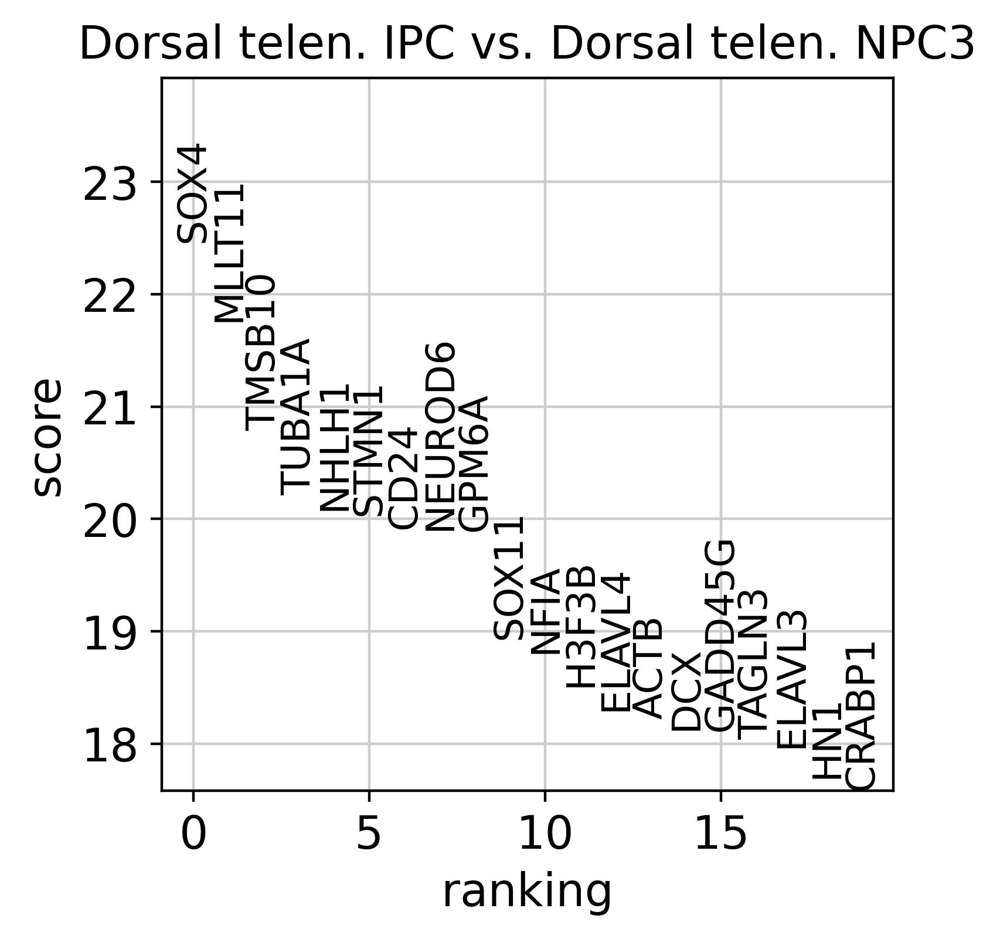

In [78]:
# Comparing Dorsal telen. IPC to reference cluster Dorsal telen. NPC3
sc.tl.rank_genes_groups(adata, 'clusters', groups=['Dorsal telen. IPC'], reference='Dorsal telen. NPC3', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['Dorsal telen. IPC'], n_genes=20, fontsize=12)